In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import os
import cv2
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Dense,Conv2D,MaxPooling2D,UpSampling2D,Flatten,Input, LeakyReLU, Add
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
from tensorflow.keras.models import load_model
import math

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
training_images=os.listdir('/content/drive/MyDrive/EE608/Project/train')

In [ ]:
data_dir = '/content/drive/MyDrive/EE608/Project/train'
create_train_set=[]
# Load and preprocess images
for root, dirs, files in os.walk(data_dir):
    for name in files:
        if name.endswith('.jpg') or name.endswith('.png'):
            filename = os.path.join(root, name)
#             image = Image.open(filename)
            img = image.load_img(filename,target_size=(256,256,3),color_mode= 'rgb')
            img=image.img_to_array(img)
            img=img/255
            create_train_set.append(img)
training_set=np.array(create_train_set)

In [ ]:
def psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    PIXEL_MAX = 255.0
    return 10 * math.log10(PIXEL_MAX / math.sqrt(mse))

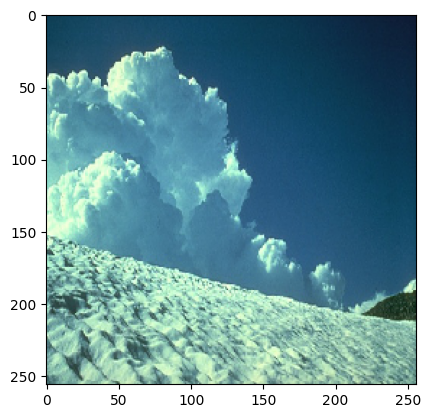

In [ ]:
plt.imshow(training_set[0])

In [ ]:
def show_img(dataset):
    fig, ax = plt.subplots(1,4)
    fig.set_size_inches(40, 20)
    for i in range(4,8):
        ax[i-4].imshow(dataset[i].reshape(256,256,3))
    plt.show()

In [ ]:
def gnoise(image):
    row,col,ch= image.shape
    mean = 0
    sigma = 1
    gauss = np.random.normal(mean,sigma,(row,col,ch))
    gauss = gauss.reshape(row,col,ch)
    noisy = image + gauss*0.20
    return noisy

In [ ]:
gnoise_set=[]
for i in training_set:
    noise=gnoise(i)
    gnoise_set.append(noise)

In [ ]:
gnoise_dataset=np.array(gnoise_set)

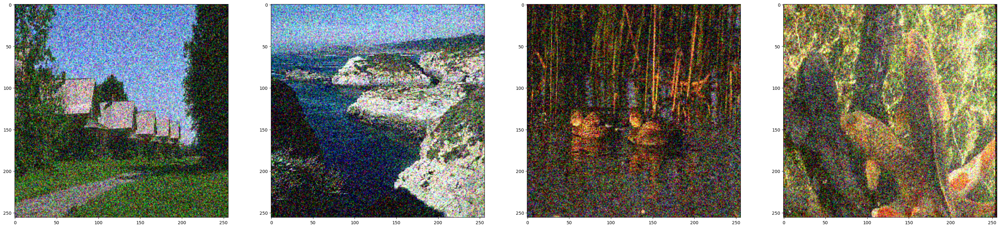

In [ ]:
show_img(gnoise_dataset)

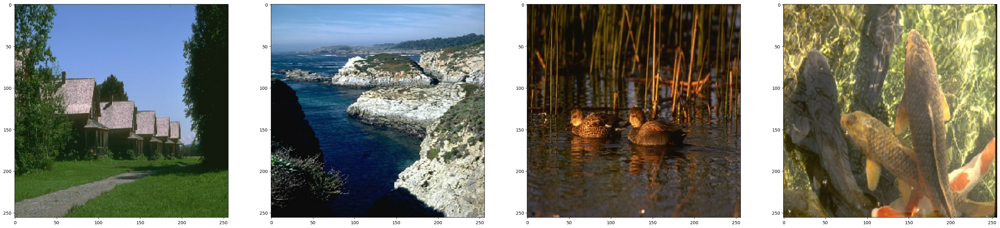

In [ ]:
show_img(training_set)

In [ ]:
training_set.shape
gnoise_dataset.shape

(200, 256, 256, 3)

In [ ]:
xtrainnoisy=gnoise_dataset[0:150]
xtestnoisy=gnoise_dataset[150:]
xtrainnoisy.shape

(150, 256, 256, 3)

# **Denoising encoder**

In [ ]:
# Define the denoising autoencoder model
def denoising_autoencoder():
    # Encoder
    inputs = Input(shape=(256,256,3), name='input_image')
    x = Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same')(inputs)
    x = Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=2)(x)
    encoded = Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=4)(x)

    # Decoder
    x = Conv2DTranspose(256, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=4)(encoded)
    x = Conv2DTranspose(128, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=2)(x)
    decoded = Conv2DTranspose(3, kernel_size=(3, 3), activation='sigmoid', padding='same')(x)

    # Create the autoencoder model
    autoencoder = tf.keras.Model(inputs=inputs, outputs=decoded)
    return autoencoder

# # Specify the input shape of your data
# input_shape = (height, width, channels)

# Create the denoising autoencoder model
model = denoising_autoencoder()
model.compile(optimizer='adam', loss='mse')

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 128)     3584      
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 256)     295168    
                                                                 
 conv2d_2 (Conv2D)           (None, 256, 256, 512)     1180160   
                                                                 
 conv2d_transpose (Conv2DTra  (None, 256, 256, 256)    1179904   
 nspose)                                                         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 256, 256, 128)    295040    
 ranspose)                                                   

In [ ]:
model.fit(xtrainnoisy, xtrainnoisy, epochs=30, batch_size=12, validation_data=(xtestnoisy, xtestnoisy))

Epoch 1/30
9/9 [==============================] - 90s 5s/step - loss: 0.0893 - val_loss: 0.0623
Epoch 2/30
9/9 [==============================] - 33s 4s/step - loss: 0.0594 - val_loss: 0.0498
Epoch 3/30
9/9 [==============================] - 33s 4s/step - loss: 0.0470 - val_loss: 0.0388
Epoch 4/30
9/9 [==============================] - 33s 4s/step - loss: 0.0412 - val_loss: 0.0410
Epoch 5/30
9/9 [==============================] - 33s 4s/step - loss: 0.0390 - val_loss: 0.0350
Epoch 6/30
9/9 [==============================] - 33s 4s/step - loss: 0.0365 - val_loss: 0.0346
Epoch 7/30
9/9 [==============================] - 33s 4s/step - loss: 0.0353 - val_loss: 0.0325
Epoch 8/30
9/9 [==============================] - 33s 4s/step - loss: 0.0336 - val_loss: 0.0325
Epoch 9/30
9/9 [==============================] - 33s 4s/step - loss: 0.0333 - val_loss: 0.0330
Epoch 10/30
9/9 [==============================] - 33s 4s/step - loss: 0.0326 - val_loss: 0.0312
Epoch 11/30
9/9 [======================

In [ ]:
model.save('/content/drive/MyDrive/EE608/Project/train/trial1.h5')

In [ ]:
model2 = load_model('/content/drive/MyDrive/EE608/Project/train/trial1.h5')

In [ ]:
test_pred = model2.predict(xtrainnoisy)

4/4 [==============================] - 9s 3s/step


Text(0.5, 1.0, 'Original Image')

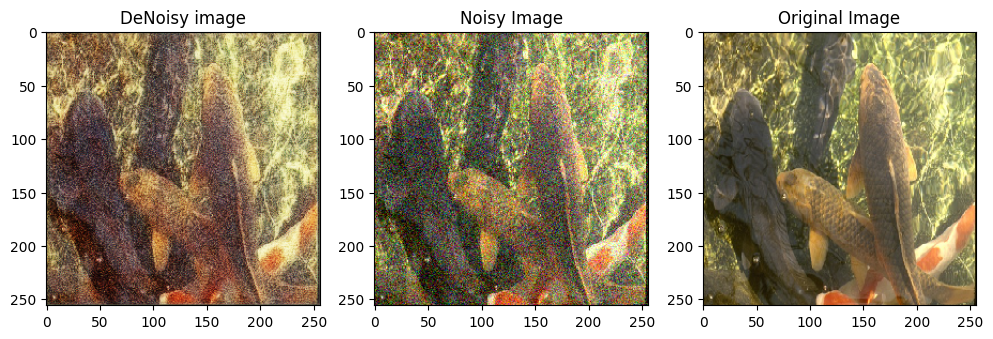

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].imshow(test_pred[7])
ax[0].set_title("DeNoisy image")

ax[1].imshow(xtrainnoisy[7])
ax[1].set_title("Noisy Image")

ax[2].imshow(training_set[7])
ax[2].set_title("Original Image")

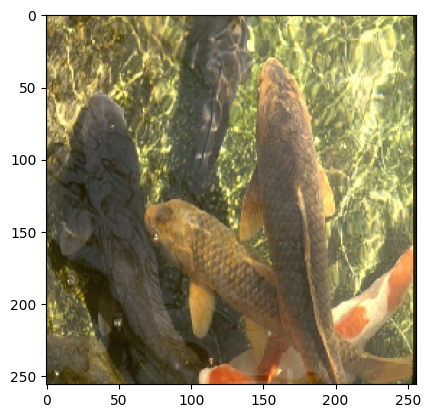

In [ ]:
plt.imshow(training_set[7])

In [ ]:
def psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    PIXEL_MAX = 255.0
    return 10 * math.log10(PIXEL_MAX / math.sqrt(mse))

In [ ]:
d = psnr(training_set[7], test_pred[7])
print("The PSNR of denoisy and original image is: ",d)
d = psnr(training_set[7], xtrainnoisy[7])
print("The PSNR of noisy and original image is: ",d)

The PSNR of denoisy and original image is: 34.15
The PSNR of noisy and original image is: 32.79


# **Blind Spot Dilation Architecture**

In [ ]:
# Define the denoising autoencoder model
def denoising_autoencoder():
    # Encoder

    inputs = Input(shape=(256,256,3), name='input_image')
    x1 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=8)(inputs)
    x1 = LeakyReLU(alpha=0.1)(x1)
    x2 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=7)(x1)
    x2 = LeakyReLU(alpha=0.1)(x2)
    res1 = Add()([x1, x2])
    x3 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=6)(res1)
    x3 = LeakyReLU(alpha=0.1)(x3)
    x4 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=6)(x3)
    x4 = LeakyReLU(alpha=0.1)(x4)
    res2 = Add()([x3, x4])
    x5 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=6)(res2)
    x5 = LeakyReLU(alpha=0.1)(x5)

    encoded = Conv2D(256, kernel_size=(3, 3), padding='same', dilation_rate=4)(x5)
    # Decoder
    x6 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=6)(encoded)
    x6 = LeakyReLU(alpha=0.1)(x6)
    x7 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=6)(x6)
    x7 = LeakyReLU(alpha=0.1)(x7)
    res3 = Add()([x6,x7])
    x8 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=7)(res3)
    x8 = LeakyReLU(alpha=0.1)(x8)
    x9 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=6)(x8)
    x9 = LeakyReLU(alpha=0.1)(x9)
    res4 = Add()([x8,x9])
    x10 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=6)(res4)
    x10 = LeakyReLU(alpha=0.1)(x10)
    decoded = Conv2DTranspose(64, kernel_size=(3, 3), activation='sigmoid', padding='same')(x10)
    x11 = Conv2D(64, kernel_size=(1,1), padding="same")(decoded)
    x11 = LeakyReLU(alpha=0.1)(x11)
    x12 = Conv2D(16, kernel_size=(1,1), padding="same")(x11)
    x12 = LeakyReLU(alpha=0.1)(x12)
    x13 = Conv2D(3, kernel_size=(1,1), padding="same")(x12)
    x13 = LeakyReLU(alpha=0.1)(x13)

    # Create the autoencoder model
    autoencoder = tf.keras.Model(inputs=inputs, outputs=x13)
    return autoencoder


# Create the denoising autoencoder model
model = denoising_autoencoder()
model.compile(optimizer='adam', loss='mse')

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_image (InputLayer)       [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_3 (Conv2D)              (None, 256, 256, 12  3584        ['input_image[0][0]']            
                                8)                                                                
                                                                                                  
 leaky_re_lu (LeakyReLU)        (None, 256, 256, 12  0           ['conv2d_3[0][0]']               
                                8)                                                          

In [ ]:
model.fit(xtrainnoisy, xtrainnoisy, epochs=17, batch_size=10, validation_data=(xtestnoisy, xtestnoisy))

Epoch 1/17
15/15 [==============================] - 91s 3s/step - loss: 0.0906 - val_loss: 0.0748
Epoch 2/17
15/15 [==============================] - 49s 3s/step - loss: 0.0709 - val_loss: 0.0652
Epoch 3/17
15/15 [==============================] - 49s 3s/step - loss: 0.0636 - val_loss: 0.0624
Epoch 4/17
15/15 [==============================] - 48s 3s/step - loss: 0.0600 - val_loss: 0.0577
Epoch 5/17
15/15 [==============================] - 49s 3s/step - loss: 0.0574 - val_loss: 0.0543
Epoch 6/17
15/15 [==============================] - 49s 3s/step - loss: 0.0543 - val_loss: 0.0538
Epoch 7/17
15/15 [==============================] - 49s 3s/step - loss: 0.0526 - val_loss: 0.0511
Epoch 8/17
15/15 [==============================] - 49s 3s/step - loss: 0.0521 - val_loss: 0.0502
Epoch 9/17
15/15 [==============================] - 48s 3s/step - loss: 0.0503 - val_loss: 0.0489
Epoch 10/17
15/15 [==============================] - 48s 3s/step - loss: 0.0491 - val_loss: 0.0480
Epoch 11/17
15/15 [

In [ ]:
test_pred = model.predict(xtrainnoisy)

5/5 [==============================] - 126s 15s/step


Text(0.5, 1.0, 'Noisy Image')

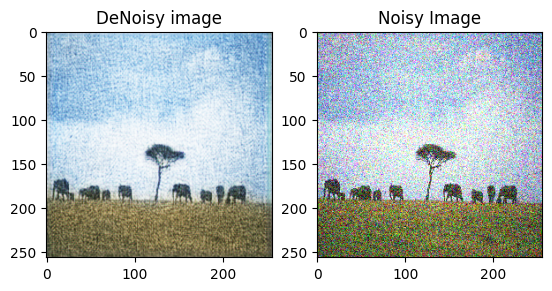

In [ ]:
fig, ax = plt.subplots(1, 2)

ax[0].imshow(test_pred[2], cmap = 'gray')
ax[0].set_title("DeNoisy image")

ax[1].imshow(xtrainnoisy[2], cmap = 'gray')
ax[1].set_title("Noisy Image")

In [ ]:
d = psnr(training_set[7], test_pred[7])
print("The PSNR of original and denoisy image is: ",d)
d = psnr(training_set[7], xtrainnoisy[7])
print("The PSNR of original and noisy image is: ",d)

The PSNR of original and denoisy image is: 35.67
The PSNR of original and noisy image is: 32.29


Text(0.5, 1.0, 'Original Image')

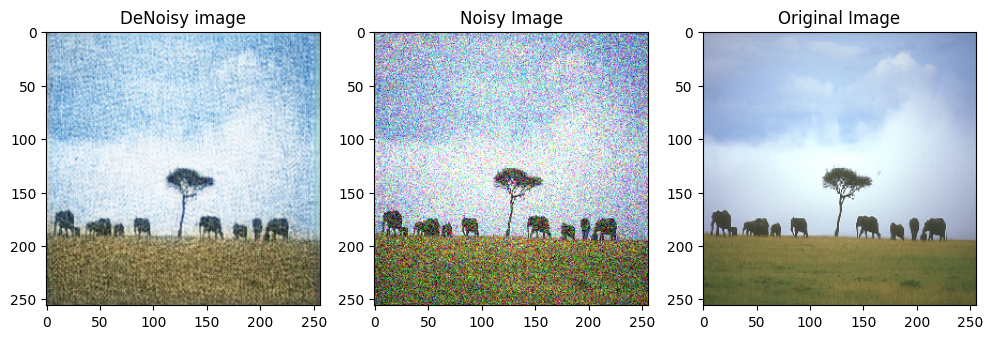

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].imshow(test_pred[2])
ax[0].set_title("DeNoisy image")

ax[1].imshow(xtrainnoisy[2])
ax[1].set_title("Noisy Image")

ax[2].imshow(training_set[2])
ax[2].set_title("Original Image")

In [ ]:
model.save('/content/drive/MyDrive/EE608/Project/train/trial2.h5')
model3 = load_model('/content/drive/MyDrive/EE608/Project/train/trial2.h5')

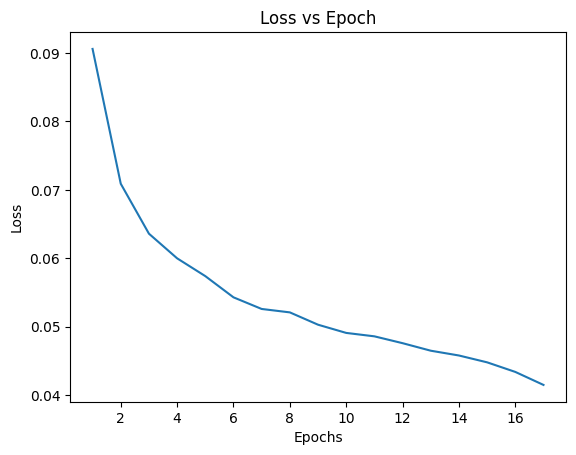

In [ ]:
loss_values = [0.0906, 0.0709, 0.0636, 0.06, 0.0574, 0.0543, 0.0526, 0.0521, 0.0503, 0.0491, 0.0486, 0.0476, 0.0465, 0.0458, 0.0448, 0.0434, 0.0415]

epochs = range(1, len(loss_values) + 1)

plt.plot(epochs, loss_values)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss vs Epoch')
plt.show()


# **Concatenate**

In [ ]:
from tensorflow.keras.layers import Concatenate

def denoising_autoencoder():
    # Encoder
    inputs = Input(shape=(256, 256, 3), name='input_image')
    x1 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(inputs)
    x1 = LeakyReLU(alpha=0.1)(x1)
    x2 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(x1)
    x2 = LeakyReLU(alpha=0.1)(x2)
    res1 = Add()([x1, x2])
    x3 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(res1)
    x3 = LeakyReLU(alpha=0.1)(x3)
    x4 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(x3)
    x4 = LeakyReLU(alpha=0.1)(x4)
    res2 = Add()([x3, x4])
    x5 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(res2)
    x5 = LeakyReLU(alpha=0.1)(x5)

    concatenated = Concatenate()([x1, x2, x3, x4, x5])

    encoded = Conv2D(256, kernel_size=(3, 3), padding='same', dilation_rate=4)(concatenated)

# Define the denoising autoencoder model
def denoising_autoencoder():
    # Encoder

    inputs = Input(shape=(256,256,3), name='input_image')
    x1 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(inputs)
    x1 = LeakyReLU(alpha=0.1)(x1)
    x2 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(x1)
    x2 = LeakyReLU(alpha=0.1)(x2)
    res1 = Add()([x1, x2])
    x3 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(res1)
    x3 = LeakyReLU(alpha=0.1)(x3)
    x4 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(x3)
    x4 = LeakyReLU(alpha=0.1)(x4)
    res2 = Add()([x3, x4])
    x5 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(res2)
    x5 = LeakyReLU(alpha=0.1)(x5)
    concatenated1 = Concatenate()([x1, x2, x3, x4, x5])
    encoded = Conv2D(256, kernel_size=(3, 3), padding='same', dilation_rate=4)(concatenated1)
    # Decoder
    x6 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=4)(encoded)
    x6 = LeakyReLU(alpha=0.1)(x6)
    x7 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=4)(x6)
    x7 = LeakyReLU(alpha=0.1)(x7)
    res3 = Add()([x6,x7])
    x8 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=4)(res3)
    x8 = LeakyReLU(alpha=0.1)(x8)
    x9 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=4)(x8)
    x9 = LeakyReLU(alpha=0.1)(x9)
    res4 = Add()([x8,x9])
    x10 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=4)(res4)
    x10 = LeakyReLU(alpha=0.1)(x10)
    concatenated2 = Concatenate()([x6,x7,x8,x9,x10])
    decoded = Conv2DTranspose(64, kernel_size=(3, 3), activation='sigmoid', padding='same')(concatenated2)
    x11 = Conv2D(64, kernel_size=(1,1), padding="same")(decoded)
    x11 = LeakyReLU(alpha=0.1)(x11)
    x12 = Conv2D(16, kernel_size=(1,1), padding="same")(x11)
    x12 = LeakyReLU(alpha=0.1)(x12)
    x13 = Conv2D(3, kernel_size=(1,1), padding="same")(x12)
    x13 = LeakyReLU(alpha=0.1)(x13)

    # Create the autoencoder model
    autoencoder = tf.keras.Model(inputs=inputs, outputs=x13)
    return autoencoder


# Create the denoising autoencoder model
model = denoising_autoencoder()
model.compile(optimizer='adam', loss='mse')

In [ ]:
model.fit(xtrainnoisy, xtrainnoisy, epochs=27, batch_size=8, validation_data=(xtestnoisy, xtestnoisy))

Epoch 1/27
19/19 [==============================] - 149s 5s/step - loss: 0.1554 - val_loss: 0.1082
Epoch 2/27
19/19 [==============================] - 59s 3s/step - loss: 0.1010 - val_loss: 0.0977
Epoch 3/27
19/19 [==============================] - 55s 3s/step - loss: 0.0991 - val_loss: 0.0992
Epoch 4/27
19/19 [==============================] - 56s 3s/step - loss: 0.0996 - val_loss: 0.0981
Epoch 5/27
19/19 [==============================] - 56s 3s/step - loss: 0.0993 - val_loss: 0.0978
Epoch 6/27
19/19 [==============================] - 60s 3s/step - loss: 0.0990 - val_loss: 0.0984
Epoch 7/27
19/19 [==============================] - 60s 3s/step - loss: 0.0992 - val_loss: 0.0995
Epoch 8/27
19/19 [==============================] - 56s 3s/step - loss: 0.0995 - val_loss: 0.0996
Epoch 9/27
19/19 [==============================] - 60s 3s/step - loss: 0.0992 - val_loss: 0.0980
Epoch 10/27
19/19 [==============================] - 56s 3s/step - loss: 0.0996 - val_loss: 0.0990
Epoch 11/27
19/19 

In [ ]:
model.save('/content/drive/MyDrive/EE608/Project/concat.h5')
concat = load_model('/content/drive/MyDrive/EE608/Project/concat.h5')

In [ ]:
test_pred = concat.predict(xtrainnoisy)

5/5 [==============================] - 123s 15s/step


Text(0.5, 1.0, 'Original Image')

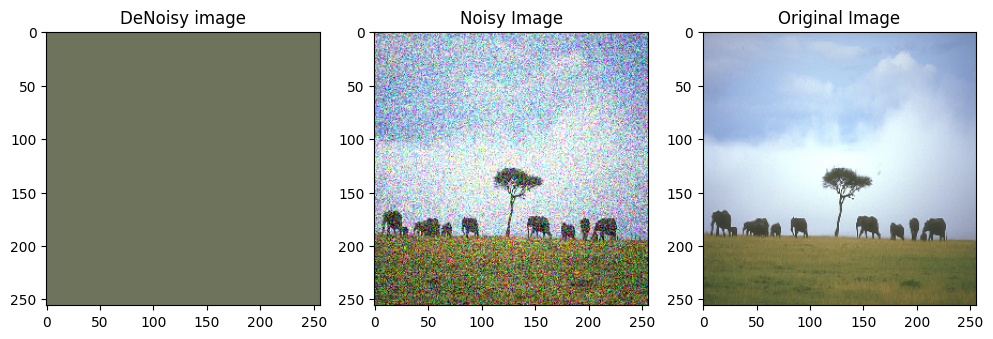

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].imshow(test_pred[2])
ax[0].set_title("DeNoisy image")

ax[1].imshow(xtrainnoisy[2])
ax[1].set_title("Noisy Image")

ax[2].imshow(training_set[2])
ax[2].set_title("Original Image")

In [ ]:
d1 = psnr(training_set[2], test_pred[2])
print("The PSNR of original and denoisy image is: ",d1)
d2 = psnr(training_set[2], xtrainnoisy[2])
print("The PSNR of original and noisy image is: ",d2)

The PSNR of original and denoisy image is:  28.41144245678303
The PSNR of original and noisy image is:  31.0430947689661


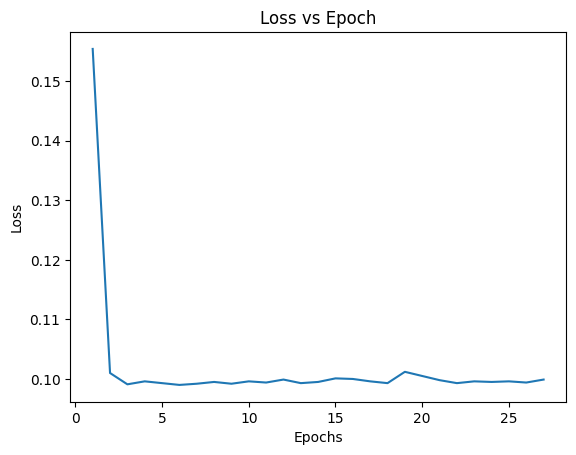

In [ ]:
loss_values = [0.1554, 0.101, 0.0991, 0.0996, 0.0993, 0.099, 0.0992, 0.0995, 0.0992, 0.0996, 0.0994, 0.0999, 0.0993, 0.0995, 0.1001, 0.1, 0.0996, 0.0993, 0.1012, 0.1005, 0.0998, 0.0993, 0.0996, 0.0995, 0.0996, 0.0994, 0.0999]

epochs = range(1, len(loss_values) + 1)

plt.plot(epochs, loss_values)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss vs Epoch')
plt.show()


# **cccccccccccccccc**

In [ ]:
from tensorflow.keras.layers import Concatenate

def denoising_autoencoder():
    # Encoder
    inputs = Input(shape=(256, 256, 3), name='input_image')
    x1 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(inputs)
    x1 = LeakyReLU(alpha=0.1)(x1)
    x2 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(x1)
    x2 = LeakyReLU(alpha=0.1)(x2)
    res1 = Add()([x1, x2])
    x3 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(res1)
    x3 = LeakyReLU(alpha=0.1)(x3)
    x4 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(x3)
    x4 = LeakyReLU(alpha=0.1)(x4)
    res2 = Add()([x3, x4])
    x5 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(res2)
    x5 = LeakyReLU(alpha=0.1)(x5)

    concatenated = Concatenate()([x1, x2, x3, x4, x5])

    encoded = Conv2D(256, kernel_size=(3, 3), padding='same', dilation_rate=4)(concatenated)

    # ... Rest of the model ...
# Define the denoising autoencoder model
def denoising_autoencoder():
    # Encoder

    inputs = Input(shape=(256,256,3), name='input_image')
    x1 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(inputs)
    x1 = LeakyReLU(alpha=0.1)(x1)
    x2 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(x1)
    x2 = LeakyReLU(alpha=0.1)(x2)
    res1 = Add()([x1, x2])
    x3 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(res1)
    x3 = LeakyReLU(alpha=0.1)(x3)
    x4 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(x3)
    x4 = LeakyReLU(alpha=0.1)(x4)
    res2 = Add()([x3, x4])
    x5 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=4)(res2)
    x5 = LeakyReLU(alpha=0.1)(x5)
    concatenated1 = Concatenate()([x1, x2, x3, x4, x5])
    encoded = Conv2D(256, kernel_size=(3, 3), padding='same', dilation_rate=4)(concatenated1)
    # Decoder
    x6 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=4)(encoded)
    x6 = LeakyReLU(alpha=0.1)(x6)
    x7 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=4)(x6)
    x7 = LeakyReLU(alpha=0.1)(x7)
    res3 = Add()([x6,x7])
    x8 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=4)(res3)
    x8 = LeakyReLU(alpha=0.1)(x8)
    x9 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=4)(x8)
    x9 = LeakyReLU(alpha=0.1)(x9)
    res4 = Add()([x8,x9])
    x10 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=4)(res4)
    x10 = LeakyReLU(alpha=0.1)(x10)
    decoded = Conv2DTranspose(64, kernel_size=(3, 3), activation='sigmoid', padding='same')(x10)
    x11 = Conv2D(64, kernel_size=(1,1), padding="same")(decoded)
    x11 = LeakyReLU(alpha=0.1)(x11)
    x12 = Conv2D(16, kernel_size=(1,1), padding="same")(x11)
    x12 = LeakyReLU(alpha=0.1)(x12)
    x13 = Conv2D(3, kernel_size=(1,1), padding="same")(x12)
    x13 = LeakyReLU(alpha=0.1)(x13)

    # Create the autoencoder model
    autoencoder = tf.keras.Model(inputs=inputs, outputs=x13)
    return autoencoder


# Create the denoising autoencoder model
model = denoising_autoencoder()
model.compile(optimizer='adam', loss='mse')

In [ ]:
history = model.fit(xtrainnoisy, xtrainnoisy, epochs=27, batch_size=8, validation_data=(xtestnoisy, xtestnoisy))

Epoch 1/27
19/19 [==============================] - 68s 3s/step - loss: 0.1090 - val_loss: 0.0677
Epoch 2/27
19/19 [==============================] - 47s 2s/step - loss: 0.0630 - val_loss: 0.0568
Epoch 3/27
19/19 [==============================] - 49s 3s/step - loss: 0.0531 - val_loss: 0.0504
Epoch 4/27
19/19 [==============================] - 55s 3s/step - loss: 0.0496 - val_loss: 0.0461
Epoch 5/27
19/19 [==============================] - 50s 3s/step - loss: 0.0457 - val_loss: 0.0420
Epoch 6/27
19/19 [==============================] - 51s 3s/step - loss: 0.0380 - val_loss: 0.0414
Epoch 7/27
19/19 [==============================] - 56s 3s/step - loss: 0.0356 - val_loss: 0.0304
Epoch 8/27
19/19 [==============================] - 51s 3s/step - loss: 0.0295 - val_loss: 0.0280
Epoch 9/27
19/19 [==============================] - 51s 3s/step - loss: 0.0267 - val_loss: 0.0246
Epoch 10/27
19/19 [==============================] - 56s 3s/step - loss: 0.0230 - val_loss: 0.0209
Epoch 11/27
19/19 [

In [ ]:
# model.save('/content/drive/MyDrive/EE608/Project/en_con.h5')
en_con = load_model('/content/drive/MyDrive/EE608/Project/en_con.h5')

In [ ]:
train_pred = en_con.predict(xtrainnoisy)

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].imshow(train_pred[0])
ax[0].set_title("DeNoisy image")

ax[1].imshow(xtrainnoisy[0])
ax[1].set_title("Noisy Image")

ax[2].imshow(training_set[0])
ax[2].set_title("Original Image")

In [ ]:
d1 = psnr(training_set[7], train_pred[7])
print("The PSNR of original and denoisy image is: ",d1)
d2 = psnr(training_set[7], xtrainnoisy[7])
print("The PSNR of original and noisy image is: ",d2)

In [ ]:
train_loss = history.history['loss']
plt.plot(range(1, len(train_loss) + 1), train_loss, label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss vs Epochs')
plt.legend()
plt.show()

# **Architecture 3**

In [ ]:
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
# Define the denoising autoencoder model
def denoising_autoencoder():
    # Encoder
    inputs = Input(shape=(256,256,3), name='input_image')
    x = Conv2D(32, kernel_size=(3, 3), activation='relu', padding='same')(inputs)
    x = Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=1)(x)
    x = Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=2)(x)
    encoded = Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=3)(x)

    # Decoder
    x = Conv2DTranspose(128, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=3)(encoded)
    x = Conv2DTranspose(64, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=2)(x)
    x = Conv2DTranspose(32, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=1)(x)
    decoded = Conv2DTranspose(3, kernel_size=(3, 3), activation='sigmoid', padding='same')(x)

    # Create the autoencoder model
    autoencoder = tf.keras.Model(inputs=inputs, outputs=decoded)
    return autoencoder

# # Specify the input shape of your data
# input_shape = (height, width, channels)

# Create the denoising autoencoder model
model = denoising_autoencoder()
model.compile(optimizer='adam', loss='mse')

In [ ]:
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_4 (Conv2D)           (None, 256, 256, 32)      896       
                                                                 
 conv2d_5 (Conv2D)           (None, 256, 256, 64)      18496     
                                                                 
 conv2d_6 (Conv2D)           (None, 256, 256, 128)     73856     
                                                                 
 conv2d_7 (Conv2D)           (None, 256, 256, 512)     590336    
                                                                 
 conv2d_transpose_4 (Conv2DT  (None, 256, 256, 128)    589952    
 ranspose)                                                       
                                                           

In [ ]:
model.fit(xtrainnoisy, xtrainnoisy, epochs=25, batch_size=10, validation_data=(xtestnoisy, xtestnoisy))

Epoch 1/25
15/15 [==============================] - 19s 1s/step - loss: 0.0751 - val_loss: 0.0633
Epoch 2/25
15/15 [==============================] - 19s 1s/step - loss: 0.0614 - val_loss: 0.0582
Epoch 3/25
15/15 [==============================] - 19s 1s/step - loss: 0.0590 - val_loss: 0.0575
Epoch 4/25
15/15 [==============================] - 18s 1s/step - loss: 0.0572 - val_loss: 0.0550
Epoch 5/25
15/15 [==============================] - 18s 1s/step - loss: 0.0538 - val_loss: 0.0509
Epoch 6/25
15/15 [==============================] - 18s 1s/step - loss: 0.0500 - val_loss: 0.0483
Epoch 7/25
15/15 [==============================] - 19s 1s/step - loss: 0.0482 - val_loss: 0.0469
Epoch 8/25
15/15 [==============================] - 18s 1s/step - loss: 0.0470 - val_loss: 0.0462
Epoch 9/25
15/15 [==============================] - 19s 1s/step - loss: 0.0463 - val_loss: 0.0454
Epoch 10/25
15/15 [==============================] - 18s 1s/step - loss: 0.0460 - val_loss: 0.0487
Epoch 11/25
15/15 [

In [ ]:
test_pred = model.predict(xtrainnoisy)

5/5 [==============================] - 59s 7s/step


In [ ]:
model.save('/content/drive/MyDrive/EE608/Project/trial3.h5')
model3 = load_model('/content/drive/MyDrive/EE608/Project/trial3.h5')

In [ ]:
train_pred = model3.predict(xtrainnoisy)

5/5 [==============================] - 5s 1s/step


Text(0.5, 1.0, 'Original Image')

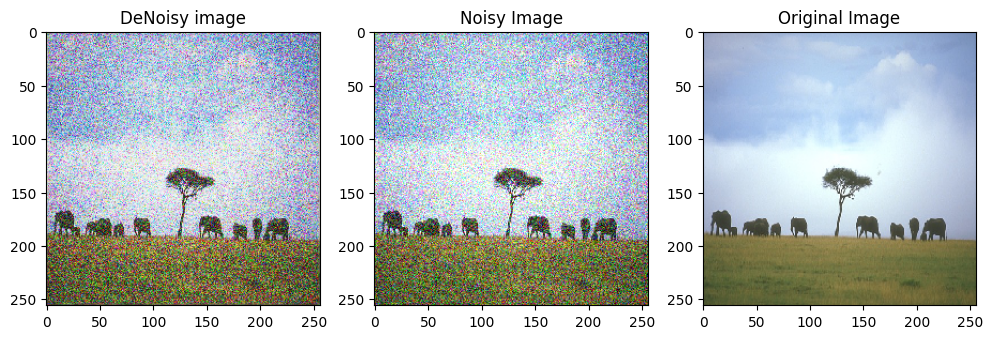

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].imshow(train_pred[2])
ax[0].set_title("DeNoisy image")

ax[1].imshow(xtrainnoisy[2])
ax[1].set_title("Noisy Image")

ax[2].imshow(training_set[2])
ax[2].set_title("Original Image")

In [ ]:
d1 = psnr(training_set[7], train_pred[7])
print("The PSNR of original and denoisy image is: ",d1)
d2 = psnr(training_set[7], xtrainnoisy[7])
print("The PSNR of original and noisy image is: ",d2)

The PSNR of original and denoisy image is:  62.72209693958828
The PSNR of original and noisy image is:  62.122245845324386


# **Architecture 4**

In [ ]:
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
# Define the denoising autoencoder model
def denoising_autoencoder():
    # Encoder
    inputs = Input(shape=(256,256,3), name='input_image')
    x = Conv2D(32, kernel_size=(3, 3), activation='relu', padding='same')(inputs)
    x = Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=7)(x)
    x = Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=8)(x)
    encoded = Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=9)(x)

    # Decoder
    x = Conv2DTranspose(128, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=9)(encoded)
    x = Conv2DTranspose(64, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=8)(x)
    x = Conv2DTranspose(32, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=7)(x)
    decoded = Conv2DTranspose(3, kernel_size=(3, 3), activation='sigmoid', padding='same')(x)

    # Create the autoencoder model
    autoencoder = tf.keras.Model(inputs=inputs, outputs=decoded)
    return autoencoder

# # Specify the input shape of your data
# input_shape = (height, width, channels)

# Create the denoising autoencoder model
model = denoising_autoencoder()
model.compile(optimizer='adam', loss='mse')

In [ ]:
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_8 (Conv2D)           (None, 256, 256, 32)      896       
                                                                 
 conv2d_9 (Conv2D)           (None, 256, 256, 64)      18496     
                                                                 
 conv2d_10 (Conv2D)          (None, 256, 256, 128)     73856     
                                                                 
 conv2d_11 (Conv2D)          (None, 256, 256, 512)     590336    
                                                                 
 conv2d_transpose_8 (Conv2DT  (None, 256, 256, 128)    589952    
 ranspose)                                                       
                                                           

In [ ]:
model.fit(xtrainnoisy, xtrainnoisy, epochs=30, batch_size=10, validation_data=(xtestnoisy, xtestnoisy))

Epoch 1/30
15/15 [==============================] - 21s 1s/step - loss: 0.0928 - val_loss: 0.0762
Epoch 2/30
15/15 [==============================] - 20s 1s/step - loss: 0.0730 - val_loss: 0.0669
Epoch 3/30
15/15 [==============================] - 19s 1s/step - loss: 0.0654 - val_loss: 0.0630
Epoch 4/30
15/15 [==============================] - 19s 1s/step - loss: 0.0618 - val_loss: 0.0597
Epoch 5/30
15/15 [==============================] - 20s 1s/step - loss: 0.0603 - val_loss: 0.0589
Epoch 6/30
15/15 [==============================] - 19s 1s/step - loss: 0.0572 - val_loss: 0.0543
Epoch 7/30
15/15 [==============================] - 19s 1s/step - loss: 0.0545 - val_loss: 0.0543
Epoch 8/30
15/15 [==============================] - 19s 1s/step - loss: 0.0545 - val_loss: 0.0509
Epoch 9/30
15/15 [==============================] - 19s 1s/step - loss: 0.0504 - val_loss: 0.0490
Epoch 10/30
15/15 [==============================] - 19s 1s/step - loss: 0.0488 - val_loss: 0.0481
Epoch 11/30
15/15 [

In [ ]:
model.save('/content/drive/MyDrive/EE608/Project/trial4.h5')
model4 = load_model('/content/drive/MyDrive/EE608/Project/trial4.h5')

In [ ]:
train_pred = model4.predict(xtrainnoisy)

5/5 [==============================] - 59s 7s/step


Text(0.5, 1.0, 'Original Image')

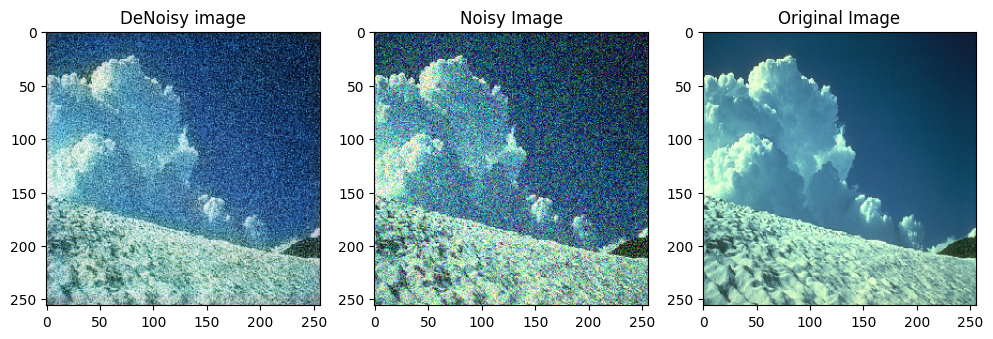

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].imshow(train_pred[0])
ax[0].set_title("DeNoisy image")

ax[1].imshow(xtrainnoisy[0])
ax[1].set_title("Noisy Image")

ax[2].imshow(training_set[0])
ax[2].set_title("Original Image")

In [ ]:
d1 = psnr(training_set[7], train_pred[7])
print("The PSNR of original and denoisy image is: ",d1)
d2 = psnr(training_set[7], xtrainnoisy[7])
print("The PSNR of original and noisy image is: ",d2)

The PSNR of original and denoisy image is:  66.44073597811624
The PSNR of original and noisy image is:  62.122245845324386


# **Architecture 5**

In [ ]:
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
# Define the denoising autoencoder model
def denoising_autoencoder():
    # Encoder
    inputs = Input(shape=(256,256,3), name='input_image')
    x = Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same')(inputs)
    x = Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=14)(x)
    x = Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=15)(x)
    encoded = Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=16)(x)

    # Decoder
    x = Conv2DTranspose(256, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=16)(encoded)
    x = Conv2DTranspose(128, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=15)(x)
    x = Conv2DTranspose(64, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=14)(x)
    decoded = Conv2DTranspose(3, kernel_size=(3, 3), activation='sigmoid', padding='same')(x)

    # Create the autoencoder model
    autoencoder = tf.keras.Model(inputs=inputs, outputs=decoded)
    return autoencoder

# # Specify the input shape of your data
# input_shape = (height, width, channels)

# Create the denoising autoencoder model
model = denoising_autoencoder()
model.compile(optimizer='adam', loss='mse')

In [ ]:
model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_12 (Conv2D)          (None, 256, 256, 64)      1792      
                                                                 
 conv2d_13 (Conv2D)          (None, 256, 256, 128)     73856     
                                                                 
 conv2d_14 (Conv2D)          (None, 256, 256, 256)     295168    
                                                                 
 conv2d_15 (Conv2D)          (None, 256, 256, 256)     590080    
                                                                 
 conv2d_transpose_12 (Conv2D  (None, 256, 256, 256)    590080    
 Transpose)                                                      
                                                           

In [ ]:
model.fit(xtrainnoisy, xtrainnoisy, epochs=30, batch_size=10, validation_data=(xtestnoisy, xtestnoisy))

Epoch 1/30
15/15 [==============================] - 70s 2s/step - loss: 0.0959 - val_loss: 0.0874
Epoch 2/30
15/15 [==============================] - 26s 2s/step - loss: 0.0801 - val_loss: 0.0693
Epoch 3/30
15/15 [==============================] - 27s 2s/step - loss: 0.0683 - val_loss: 0.0656
Epoch 4/30
15/15 [==============================] - 27s 2s/step - loss: 0.0640 - val_loss: 0.0619
Epoch 5/30
15/15 [==============================] - 27s 2s/step - loss: 0.0609 - val_loss: 0.0581
Epoch 6/30
15/15 [==============================] - 29s 2s/step - loss: 0.0603 - val_loss: 0.0602
Epoch 7/30
15/15 [==============================] - 29s 2s/step - loss: 0.0581 - val_loss: 0.0560
Epoch 8/30
15/15 [==============================] - 27s 2s/step - loss: 0.0546 - val_loss: 0.0525
Epoch 9/30
15/15 [==============================] - 27s 2s/step - loss: 0.0509 - val_loss: 0.0497
Epoch 10/30
15/15 [==============================] - 29s 2s/step - loss: 0.0490 - val_loss: 0.0477
Epoch 11/30
15/15 [

In [ ]:
# model.save('/content/drive/MyDrive/EE608/Project/trial5.h5')


In [ ]:
model5 = load_model('/content/drive/MyDrive/EE608/Project/trial5.h5')

In [ ]:
train_pred = model5.predict(xtrainnoisy)

5/5 [==============================] - 83s 9s/step


Text(0.5, 1.0, 'Original Image')

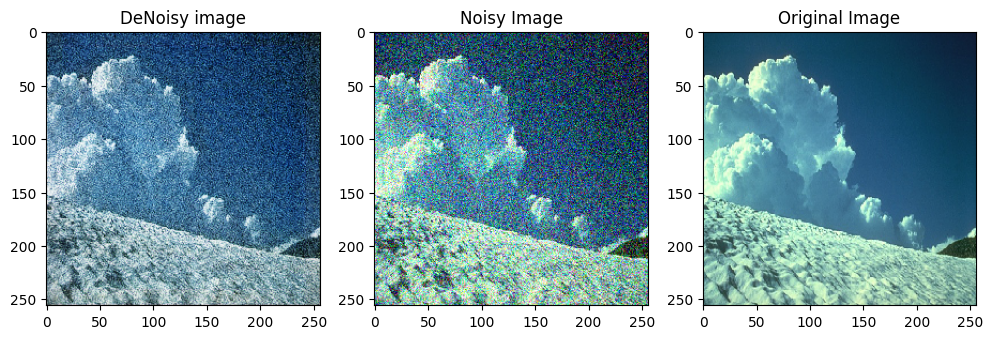

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].imshow(train_pred[0])
ax[0].set_title("DeNoisy image")

ax[1].imshow(xtrainnoisy[0])
ax[1].set_title("Noisy Image")

ax[2].imshow(training_set[0])
ax[2].set_title("Original Image")

In [ ]:
d1 = psnr(training_set[7], train_pred[7])
print("The PSNR of original and denoisy image is: ",d1)
d2 = psnr(training_set[7], xtrainnoisy[7])
print("The PSNR of original and noisy image is: ",d2)

The PSNR of original and denoisy image is:  66.3485714274507
The PSNR of original and noisy image is:  62.11488376919259


# **Architecture 6**

In [ ]:
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
# Define the denoising autoencoder model
def denoising_autoencoder():
    # Encoder
    inputs = Input(shape=(256,256,3), name='input_image')
    x = Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same')(inputs)
    x = Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=14)(x)
    x = Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=15)(x)
    encoded = Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=16)(x)

    # Decoder
    x = Conv2DTranspose(256, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=16)(encoded)
    x = Conv2DTranspose(128, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=15)(x)
    x = Conv2DTranspose(64, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=14)(x)
    decoded = Conv2DTranspose(3, kernel_size=(3, 3), activation='sigmoid', padding='same')(x)

    # Create the autoencoder model
    autoencoder = tf.keras.Model(inputs=inputs, outputs=decoded)
    return autoencoder

# # Specify the input shape of your data
# input_shape = (height, width, channels)

# Create the denoising autoencoder model
model = denoising_autoencoder()
model.compile(optimizer='adam', loss='mse')

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 128)     73856     
                                                                 
 conv2d_2 (Conv2D)           (None, 256, 256, 256)     295168    
                                                                 
 conv2d_3 (Conv2D)           (None, 256, 256, 512)     1180160   
                                                                 
 conv2d_transpose (Conv2DTra  (None, 256, 256, 256)    1179904   
 nspose)                                                         
                                                             

In [ ]:
model.fit(xtrainnoisy, xtrainnoisy, epochs=30, batch_size=10, validation_data=(xtestnoisy, xtestnoisy))

Epoch 1/30
15/15 [==============================] - 97s 4s/step - loss: 0.1064 - val_loss: 0.1007
Epoch 2/30
15/15 [==============================] - 57s 4s/step - loss: 0.0880 - val_loss: 0.0815
Epoch 3/30
15/15 [==============================] - 52s 3s/step - loss: 0.0769 - val_loss: 0.0705
Epoch 4/30
15/15 [==============================] - 52s 3s/step - loss: 0.0697 - val_loss: 0.0645
Epoch 5/30
15/15 [==============================] - 52s 3s/step - loss: 0.0634 - val_loss: 0.0608
Epoch 6/30
15/15 [==============================] - 57s 4s/step - loss: 0.0595 - val_loss: 0.0558
Epoch 7/30
15/15 [==============================] - 52s 4s/step - loss: 0.0549 - val_loss: 0.0524
Epoch 8/30
15/15 [==============================] - 57s 4s/step - loss: 0.0527 - val_loss: 0.0510
Epoch 9/30
15/15 [==============================] - 52s 4s/step - loss: 0.0507 - val_loss: 0.0489
Epoch 10/30
15/15 [==============================] - 52s 3s/step - loss: 0.0489 - val_loss: 0.0477
Epoch 11/30
15/15 [

In [ ]:
model.save('/content/drive/MyDrive/EE608/Project/trial6.h5')
model6 = load_model('/content/drive/MyDrive/EE608/Project/trial6.h5')

In [ ]:
train_pred = model6.predict(xtrainnoisy)

5/5 [==============================] - 115s 14s/step


Text(0.5, 1.0, 'Original Image')

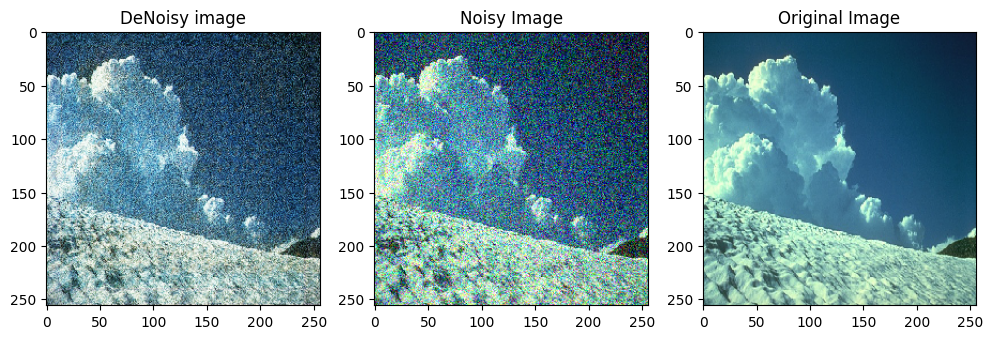

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].imshow(train_pred[0])
ax[0].set_title("DeNoisy image")

ax[1].imshow(xtrainnoisy[0])
ax[1].set_title("Noisy Image")

ax[2].imshow(training_set[0])
ax[2].set_title("Original Image")

In [ ]:
d1 = psnr(training_set[7], train_pred[7])
print("The PSNR of original and denoisy image is: ",d1)
d2 = psnr(training_set[7], xtrainnoisy[7])
print("The PSNR of original and noisy image is: ",d2)

The PSNR of original and denoisy image is:  65.9766481119227
The PSNR of original and noisy image is:  62.12639557990444


# **Architecture 7**

In [ ]:
# Define the denoising autoencoder model
def denoising_autoencoder():
    # Encoder

    inputs = Input(shape=(256,256,3), name='input_image')
    x = Conv2D(128, kernel_size=(3, 3), activation='relu', padding="same")(inputs)
    x = LeakyReLU(alpha=0.1)(x)
    x = Conv2D(128, kernel_size=(3, 3), activation='relu', padding="same", dilation_rate=4)(x)
    x = LeakyReLU(alpha=0.1)(x)
    x = Conv2D(128, kernel_size=(3, 3), activation='relu', padding="same", dilation_rate=4)(x)
    x = LeakyReLU(alpha=0.1)(x)
    encoded = Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=4)(x)
    # Decoder
    x = Conv2DTranspose(128, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=4)(encoded)
    x = Conv2DTranspose(128, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=4)(x)
    x = Conv2DTranspose(128, kernel_size=(3, 3), activation='relu', padding='same', dilation_rate=4)(x)
    decoded = Conv2DTranspose(3, kernel_size=(3, 3), activation='sigmoid', padding='same')(x)

    # Create the autoencoder model
    autoencoder = tf.keras.Model(inputs=inputs, outputs=decoded)
    return autoencoder

# # Specify the input shape of your data
# input_shape = (height, width, channels)

# Create the denoising autoencoder model
model = denoising_autoencoder()
model.compile(optimizer='adam', loss='mse')

In [ ]:
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_7 (Conv2D)           (None, 256, 256, 128)     3584      
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 256, 256, 128)     0         
                                                                 
 conv2d_8 (Conv2D)           (None, 256, 256, 128)     147584    
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 256, 256, 128)     0         
                                                                 
 conv2d_9 (Conv2D)           (None, 256, 256, 128)     147584    
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 256, 256, 128)     0   

In [ ]:
model.fit(xtrainnoisy, xtrainnoisy, epochs=30, batch_size=10, validation_data=(xtestnoisy, xtestnoisy))

Epoch 1/30
15/15 [==============================] - 49s 2s/step - loss: 0.0900 - val_loss: 0.0727
Epoch 2/30
15/15 [==============================] - 29s 2s/step - loss: 0.0659 - val_loss: 0.0625
Epoch 3/30
15/15 [==============================] - 29s 2s/step - loss: 0.0597 - val_loss: 0.0571
Epoch 4/30
15/15 [==============================] - 29s 2s/step - loss: 0.0551 - val_loss: 0.0518
Epoch 5/30
15/15 [==============================] - 32s 2s/step - loss: 0.0521 - val_loss: 0.0509
Epoch 6/30
15/15 [==============================] - 29s 2s/step - loss: 0.0500 - val_loss: 0.0483
Epoch 7/30
15/15 [==============================] - 29s 2s/step - loss: 0.0479 - val_loss: 0.0479
Epoch 8/30
15/15 [==============================] - 29s 2s/step - loss: 0.0474 - val_loss: 0.0453
Epoch 9/30
15/15 [==============================] - 32s 2s/step - loss: 0.0453 - val_loss: 0.0428
Epoch 10/30
15/15 [==============================] - 29s 2s/step - loss: 0.0417 - val_loss: 0.0396
Epoch 11/30
15/15 [

In [ ]:
# model.save('/content/drive/MyDrive/EE608/Project/trial7.h5')
model7 = load_model('/content/drive/MyDrive/EE608/Project/trial7.h5')

In [ ]:
train_pred = model7.predict(xtrainnoisy)

2/5 [===========>..................] - ETA: 6:25

Text(0.5, 1.0, 'Noisy Image')

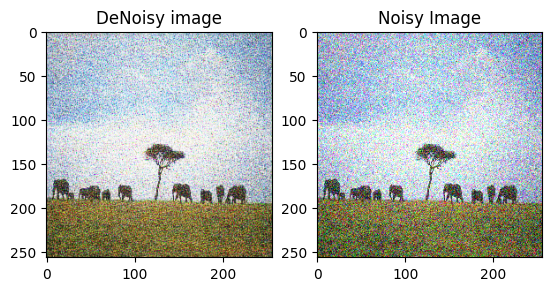

In [ ]:
fig, ax = plt.subplots(1, 2)

ax[0].imshow(test_pred[2], cmap = 'gray')
ax[0].set_title("DeNoisy image")

ax[1].imshow(xtrainnoisy[2], cmap = 'gray')
ax[1].set_title("Noisy Image")

In [ ]:
d1 = psnr(training_set[7], test_pred[7])
print("The PSNR of original and denoisy image is: ",d1)
d2 = psnr(training_set[7], xtrainnoisy[7])
print("The PSNR of original and noisy image is: ",d2)

The PSNR of original and denoisy image is:  64.90542275431889
The PSNR of original and noisy image is:  62.106847932419456


# **Architecture 8**

In [ ]:
# Define the denoising autoencoder model
def denoising_autoencoder():
    # Encoder

    inputs = Input(shape=(256,256,3), name='input_image')
    x1 = Conv2D(128, kernel_size=(3, 3), padding="same")(inputs)
    x1 = LeakyReLU(alpha=0.1)(x1)
    x2 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=7)(x1)
    x2 = LeakyReLU(alpha=0.1)(x2)
    res = Add()([x1, x2])
    x3 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=6)(res)
    x3 = LeakyReLU(alpha=0.1)(x3)
    encoded = Conv2D(512, kernel_size=(3, 3), padding='same', dilation_rate=6)(x3)
    # Decoder
    x4 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=6)(encoded)
    x4 = LeakyReLU(alpha=0.1)(x4)
    x5 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=6)(x4)
    x5 = LeakyReLU(alpha=0.1)(x5)
    x6 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=7)(x5)
    x6 = LeakyReLU(alpha=0.1)(x6)
    decoded = Conv2DTranspose(3, kernel_size=(3, 3), activation='sigmoid', padding='same')(x6)

    # Create the autoencoder model
    autoencoder = tf.keras.Model(inputs=inputs, outputs=decoded)
    return autoencoder

# # Specify the input shape of your data
# input_shape = (height, width, channels)

# Create the denoising autoencoder model
model = denoising_autoencoder()
model.compile(optimizer='adam', loss='mse')

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_image (InputLayer)       [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_6 (Conv2D)              (None, 256, 256, 12  3584        ['input_image[0][0]']            
                                8)                                                                
                                                                                                  
 leaky_re_lu_8 (LeakyReLU)      (None, 256, 256, 12  0           ['conv2d_6[0][0]']               
                                8)                                                          

In [ ]:
model.fit(xtrainnoisy, xtrainnoisy, epochs=27, batch_size=8, validation_data=(xtestnoisy, xtestnoisy))

Epoch 1/27
19/19 [==============================] - 55s 2s/step - loss: 0.0810 - val_loss: 0.0629
Epoch 2/27
19/19 [==============================] - 24s 1s/step - loss: 0.0608 - val_loss: 0.0550
Epoch 3/27
19/19 [==============================] - 26s 1s/step - loss: 0.0563 - val_loss: 0.0521
Epoch 4/27
19/19 [==============================] - 26s 1s/step - loss: 0.0513 - val_loss: 0.0492
Epoch 5/27
19/19 [==============================] - 26s 1s/step - loss: 0.0480 - val_loss: 0.0466
Epoch 6/27
19/19 [==============================] - 26s 1s/step - loss: 0.0439 - val_loss: 0.0415
Epoch 7/27
19/19 [==============================] - 26s 1s/step - loss: 0.0383 - val_loss: 0.0351
Epoch 8/27
19/19 [==============================] - 26s 1s/step - loss: 0.0334 - val_loss: 0.0313
Epoch 9/27
19/19 [==============================] - 26s 1s/step - loss: 0.0310 - val_loss: 0.0302
Epoch 10/27
19/19 [==============================] - 24s 1s/step - loss: 0.0304 - val_loss: 0.0304
Epoch 11/27
19/19 [

In [ ]:
model.save('/content/drive/MyDrive/EE608/Project/trial8.h5')
model8 = load_model('/content/drive/MyDrive/EE608/Project/trial8.h5')

In [ ]:
train_pred = model8.predict(xtrainnoisy)

5/5 [==============================] - 72s 9s/step


Text(0.5, 1.0, 'Original Image')

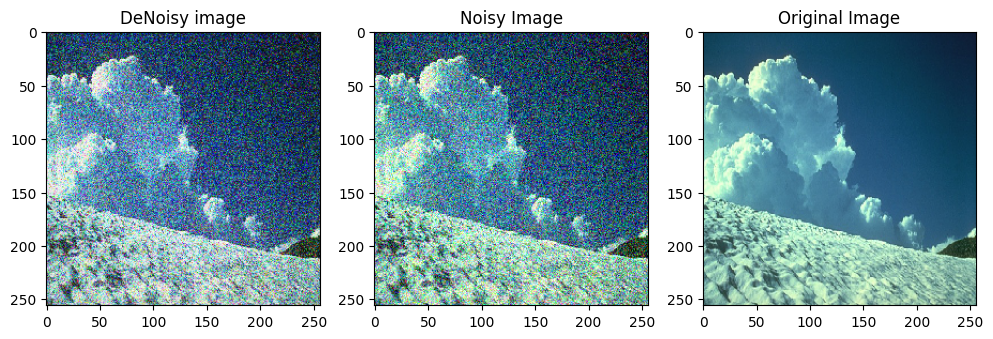

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].imshow(train_pred[0])
ax[0].set_title("DeNoisy image")

ax[1].imshow(xtrainnoisy[0])
ax[1].set_title("Noisy Image")

ax[2].imshow(training_set[0])
ax[2].set_title("Original Image")

In [ ]:
d1 = psnr(training_set[7], train_pred[7])
print("The PSNR of original and denoisy image is: ",d1)
d2 = psnr(training_set[7], xtrainnoisy[7])
print("The PSNR of original and noisy image is: ",d2)

The PSNR of original and denoisy image is:  62.89727362176752
The PSNR of original and noisy image is:  62.1044935792831


# **Architecture 9**

In [ ]:
# Define the denoising autoencoder model
def denoising_autoencoder():
    # Encoder

    inputs = Input(shape=(256,256,3), name='input_image')
    x1 = Conv2D(128, kernel_size=(3, 3), padding="same")(inputs)
    x1 = LeakyReLU(alpha=0.1)(x1)
    x2 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=7)(x1)
    x2 = LeakyReLU(alpha=0.1)(x2)
    res = Add()([x1, x2])
    x3 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=6)(res)
    x3 = LeakyReLU(alpha=0.1)(x3)
    encoded = Conv2D(512, kernel_size=(3, 3), padding='same', dilation_rate=6)(x3)
    # Decoder
    x4 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=6)(encoded)
    x4 = LeakyReLU(alpha=0.1)(x4)
    x5 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=6)(x4)
    x5 = LeakyReLU(alpha=0.1)(x5)
    x6 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=7)(x5)
    x6 = LeakyReLU(alpha=0.1)(x6)
    decoded = Conv2DTranspose(64, kernel_size=(3, 3), activation='sigmoid', padding='same')(x6)
    x7 = Conv2D(55, kernel_size=(1,1), padding="same")(decoded)
    x7 = LeakyReLU(alpha=0.1)(x7)
    x8 = Conv2D(3, kernel_size=(1,1), padding="same")(x7)
    x8 = LeakyReLU(alpha=0.1)(x8)
    # Create the autoencoder model
    autoencoder = tf.keras.Model(inputs=inputs, outputs=x8)
    return autoencoder

# # Specify the input shape of your data
# input_shape = (height, width, channels)

# Create the denoising autoencoder model
model = denoising_autoencoder()
model.compile(optimizer='adam', loss='mse')

In [ ]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_image (InputLayer)       [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_10 (Conv2D)             (None, 256, 256, 12  3584        ['input_image[0][0]']            
                                8)                                                                
                                                                                                  
 leaky_re_lu_14 (LeakyReLU)     (None, 256, 256, 12  0           ['conv2d_10[0][0]']              
                                8)                                                          

In [ ]:
model.fit(xtrainnoisy, xtrainnoisy, epochs=27, batch_size=8, validation_data=(xtestnoisy, xtestnoisy))

Epoch 1/27
19/19 [==============================] - 33s 1s/step - loss: 0.1544 - val_loss: 0.0750
Epoch 2/27
19/19 [==============================] - 24s 1s/step - loss: 0.0703 - val_loss: 0.0631
Epoch 3/27
19/19 [==============================] - 27s 1s/step - loss: 0.0592 - val_loss: 0.0556
Epoch 4/27
19/19 [==============================] - 27s 1s/step - loss: 0.0545 - val_loss: 0.0515
Epoch 5/27
19/19 [==============================] - 25s 1s/step - loss: 0.0511 - val_loss: 0.0493
Epoch 6/27
19/19 [==============================] - 25s 1s/step - loss: 0.0477 - val_loss: 0.0474
Epoch 7/27
19/19 [==============================] - 27s 1s/step - loss: 0.0443 - val_loss: 0.0450
Epoch 8/27
19/19 [==============================] - 25s 1s/step - loss: 0.0421 - val_loss: 0.0378
Epoch 9/27
19/19 [==============================] - 27s 1s/step - loss: 0.0357 - val_loss: 0.0327
Epoch 10/27
19/19 [==============================] - 27s 1s/step - loss: 0.0312 - val_loss: 0.0301
Epoch 11/27
19/19 [

In [ ]:
model.save('/content/drive/MyDrive/EE608/Project/trial9.h5')
model9 = load_model('/content/drive/MyDrive/EE608/Project/trial9.h5')

In [ ]:
train_pred = model9.predict(xtrainnoisy)

5/5 [==============================] - 14s 2s/step


In [ ]:
d1 = psnr(training_set[2], train_pred[2])
print("The PSNR of original and denoisy image is: ",d1)
d2 = psnr(training_set[2], xtrainnoisy[2])
print("The PSNR of original and noisy image is: ",d2)

The PSNR of original and denoisy image is:  62.196434647407266
The PSNR of original and noisy image is:  62.10156943580649


Text(0.5, 1.0, 'Original Image')

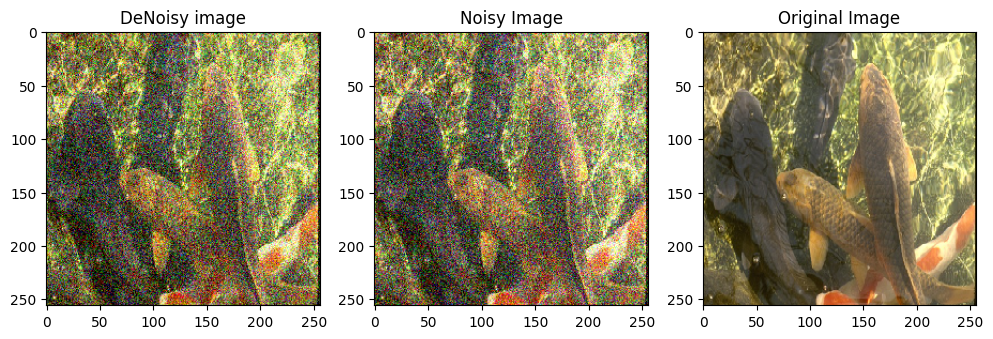

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].imshow(train_pred[7])
ax[0].set_title("DeNoisy image")

ax[1].imshow(xtrainnoisy[7])
ax[1].set_title("Noisy Image")

ax[2].imshow(training_set[7])
ax[2].set_title("Original Image")

# **Architecture 10**

In [ ]:
# Define the denoising autoencoder model
def denoising_autoencoder():
    # Encoder

    inputs = Input(shape=(256,256,3), name='input_image')
    x1 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=8)(inputs)
    x1 = LeakyReLU(alpha=0.1)(x1)
    x2 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=7)(x1)
    x2 = LeakyReLU(alpha=0.1)(x2)
    res1 = Add()([x1, x2])
    x3 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=6)(res1)
    x3 = LeakyReLU(alpha=0.1)(x3)
    x4 = Conv2D(128, kernel_size=(3, 3), padding="same", dilation_rate=6)(x3)
    x4 = LeakyReLU(alpha=0.1)(x4)
    res2 = Add()([x3, x4])
    encoded = Conv2D(256, kernel_size=(3, 3), padding='same', dilation_rate=4)(res2)
    # Decoder
    x5 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=6)(encoded)
    x5 = LeakyReLU(alpha=0.1)(x5)
    x6 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=6)(x5)
    x6 = LeakyReLU(alpha=0.1)(x6)
    res3 = Add()([x5,x6])
    x7 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=7)(res3)
    x7 = LeakyReLU(alpha=0.1)(x7)
    x8 = Conv2DTranspose(128, kernel_size=(3, 3), padding='same', dilation_rate=6)(x7)
    x8 = LeakyReLU(alpha=0.1)(x8)
    res4 = Add()([x7,x8])
    decoded = Conv2DTranspose(64, kernel_size=(3, 3), activation='sigmoid', padding='same')(res4)
    x9 = Conv2D(64, kernel_size=(1,1), padding="same")(decoded)
    x9 = LeakyReLU(alpha=0.1)(x9)
    x10 = Conv2D(16, kernel_size=(1,1), padding="same")(x9)
    x10 = LeakyReLU(alpha=0.1)(x10)
    x11 = Conv2D(3, kernel_size=(1,1), padding="same")(x10)
    x11 = LeakyReLU(alpha=0.1)(x11)

    # Create the autoencoder model
    autoencoder = tf.keras.Model(inputs=inputs, outputs=x8)
    return autoencoder

# # Specify the input shape of your data
# input_shape = (height, width, channels)

# Create the denoising autoencoder model
model = denoising_autoencoder()
model.compile(optimizer='adam', loss='mse')